In [1]:
import sys
sys.path.append('/content/drive/MyDrive/Uni/Deep Learning for Computer Vision/GeoGuessr_Project')

# folder with pictures
ROOT_DIR = r'C:\Users\Shadow\Pictures\Geogussr\Projekt'

# dir to csv files
dir = r"C:\Users\Shadow\Documents\DLCV_Project_GeoGuessr_AI-Basti\preprocess"

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision import models
#from torchsummary import summary
from torch.optim import lr_scheduler


# Dataset
from GeoGuessrDataset import GeoGuessrDataset


import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm.notebook import tnrange
import time
import copy
import pygeohash as phg


%matplotlib inline

# Enable autoreloading of imported modules.
%load_ext autoreload
%autoreload 2

In [3]:

# Check GPU support on your machine.
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)

HEIGHT = 512
WIDTH = 2560

cuda:0


In [4]:

# from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models.resnet import resnet50, ResNet50_Weights, resnet18, ResNet18_Weights


# New weights with accuracy 80.858%
resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)

# Best available weights (currently alias for IMAGENET1K_V2)
# Note that these weights may change across versions
resnet50(weights=ResNet50_Weights.DEFAULT)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:



df = pd.read_csv(dir+"\coordinates.csv", delimiter=',', skiprows=0, low_memory=False)

# We want a geohash precsion of 3 so that we get approximately 32768 cells, which will represent our classes.
df['geohash']=df.apply(lambda coords: phg.encode(coords.latitude, coords.longitude, precision=3), axis=1)

"""
def geohash_to_decimal(geohash):
    base_32 = '0123456789bcdefghjkmnpqrstuvwxyz';
    geohash = geohash.lower()
    # Check that the input geohash is a valid geohash
    if not all(c in base_32 for c in geohash):
        raise ValueError('Invalid geohash')
    return sum([32**idx * base_32.index(char) for idx, char in enumerate(geohash[::-1])])
"""
def geohash_to_decimal(geohash):
    base_32 = '0123456789bcdefghjkmnpqrstuvwxyz';
    geohash = geohash.lower()
    res = 0
    for idx, char in enumerate(geohash[::-1]):
        temp = 32**idx * base_32.index(char)
        res += temp
    return res

df['geohash_decimal']=df.apply(lambda x: geohash_to_decimal(x["geohash"]) ,axis=1)

geohashes_with_samples = df["geohash_decimal"].unique()
print("Number of geohashes with samples", len(geohashes_with_samples))

geohash_map = { geo: i for i, geo in enumerate(geohashes_with_samples)}

df["geo_code"] = df.apply(lambda geohash: geohash_map[geohash["geohash_decimal"]], axis=1)

df[["filename", "latitude","longitude", "geohash_decimal", "geo_code"]].to_csv(dir+"\coordinates2.csv", index=False)

# Add geohash center coordinates to csv

def geohash_center(geohash_name):

    # Decode the geohash to get the center coordinates and errors.
    latitude, longitude, latitude_error, longitude_error = phg.decode_exactly(geohash_name)
    return [latitude, longitude]

df["geo_lat"], df["geo_lon"] = df.apply(lambda x: geohash_center(x["geohash"])[0] ,axis=1), df.apply(lambda x: geohash_center(x["geohash"])[1] ,axis=1)

# drop the duplicates
df = df.drop(columns=["filename", "latitude", "longitude","geohash_decimal","geohash"] )
df = df.drop_duplicates()
array = df.to_numpy()
array = np.array(array, dtype=np.float64)
tensor = torch.tensor(array)
torch.save(tensor, dir+'\\tensor.pt')
# Save the DataFrame to a CSV file.
df[["geo_code", "geo_lat", "geo_lon"]].to_csv(dir+"\coords_center.csv", index=False)


Number of geohashes with samples 3139


In [6]:
import pygeohash as pgh

df = pd.read_csv(dir + r"\coordinates2.csv", delimiter=',', skiprows=0, low_memory=False)

# We want a geohash precsion of 3 so that we get 32768 cells, which will represent our classes.
df['geohash']=df.apply(lambda coords: pgh.encode(coords.latitude, coords.longitude, precision=3), axis=1)

df.head()

def geohash_to_decimal(geohash):
    base_32 = '0123456789bcdefghjkmnpqrstuvwxyz';
    geohash = geohash.lower()
    res = 0
    for idx, char in enumerate(geohash[::-1]):
      temp = 32**idx * base_32.index(char)
      res += temp
    return res
    

df['geohash_decimal']=df.apply(lambda x: geohash_to_decimal(str(x["geohash"])) ,axis=1)

geohashes_with_samples = df["geohash_decimal"].unique()
print("Number of geohashes with samples", len(geohashes_with_samples))

geohash_map = { geo: i for i, geo in enumerate(geohashes_with_samples)}

df["geo_code"] = df.apply(lambda geohash: geohash_map[geohash["geohash_decimal"]], axis=1)

df[["filename", "latitude","longitude", "geohash_decimal", "geo_code"]].to_csv(ROOT_DIR + "coordinates_geohash.csv", index=False)

df.head()


# Define the data transformation
transform = transforms.Compose([
    transforms.ToTensor(),  # convert images to tensors
    # transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),  # normalize images
    # transforms.Resize((250, 1000))
])

# Load the dataset and split it into training and validation sets
dataset = GeoGuessrDataset(csv_file=f'{dir}/coordinates2.csv',
                                    root_dir=ROOT_DIR, transform=transform, num_classes=3139)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# Define the dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=0)
val_dataloader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=0)

dataloaders = {"train" : train_dataloader, "val": val_dataloader}
dataset_sizes = {"train": train_size, "val" : val_size}


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


Number of geohashes with samples 3139


In [7]:
# Define the data transformation
transform = transforms.Compose([
    transforms.ToTensor(),  # convert images to tensors
    #transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),  # normalize images
    #transforms.Resize((250, 1000))
])

# Load the dataset and split it into training and validation sets
dataset = GeoGuessrDataset(csv_file=dir+'\coordinates2.csv',
                                    root_dir=ROOT_DIR, transform=transform, num_classes=3139)
train_size = int(0.80 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])
print(len(train_dataset))
# Define the dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=3)
val_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=3)

dataloaders = {"train" : train_dataloader, "val": val_dataloader}
dataset_sizes = {"train": train_size, "val" : val_size}


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")



for i, batch in enumerate(train_dataloader):
    x, y, z = batch["image"], batch["geohash"], batch['gt']
    print(x.shape, y.shape, z.shape)
    break
    

103009
torch.Size([1, 3, 512, 2560]) torch.Size([1, 3139]) torch.Size([1, 2])


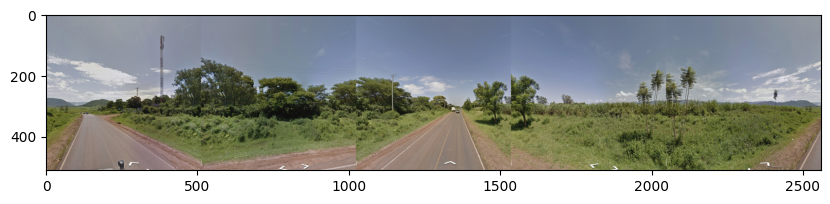

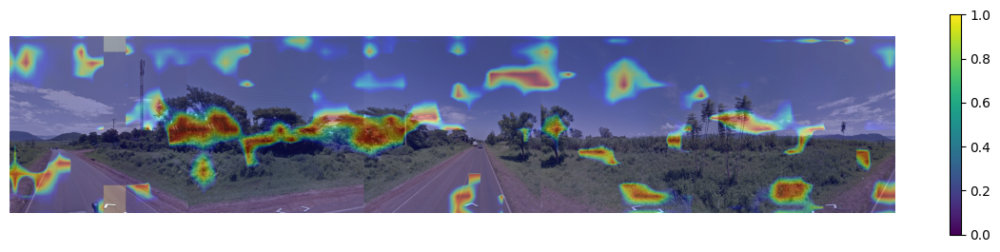

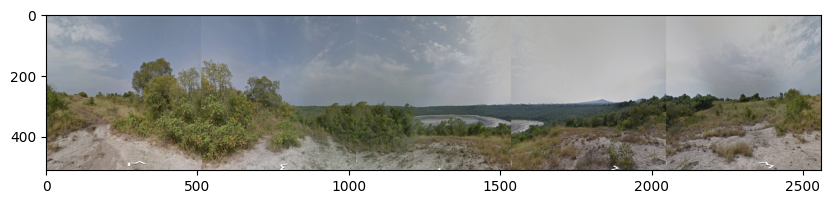

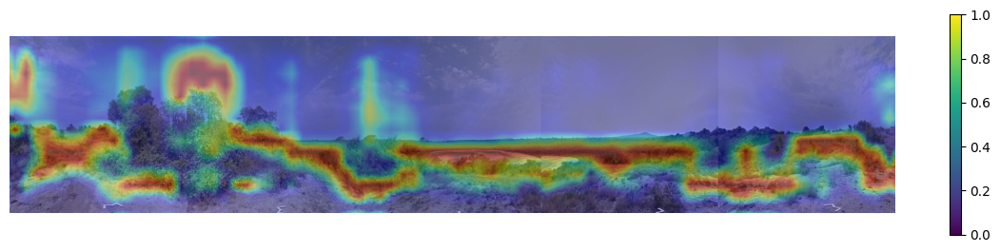

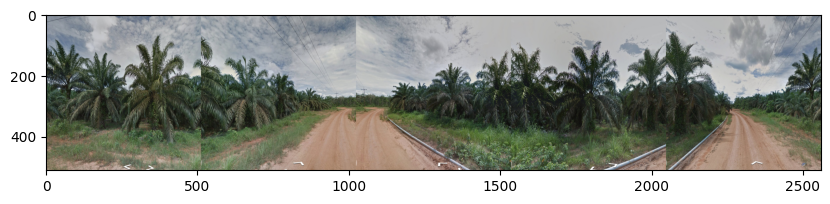

...

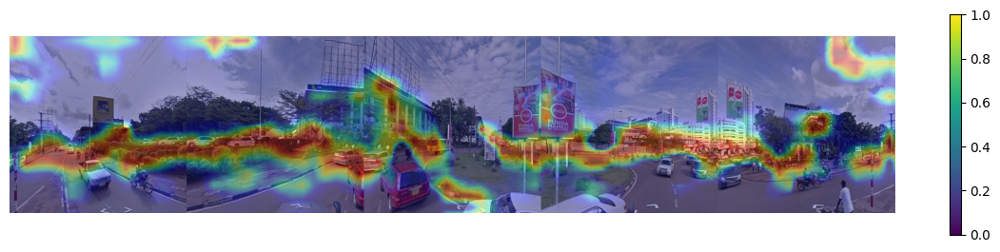

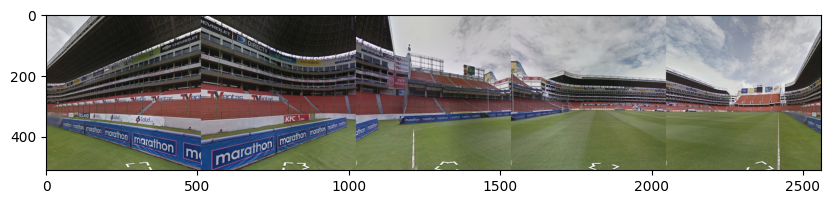

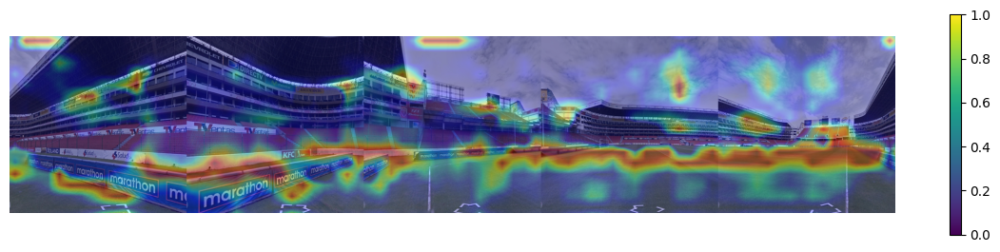

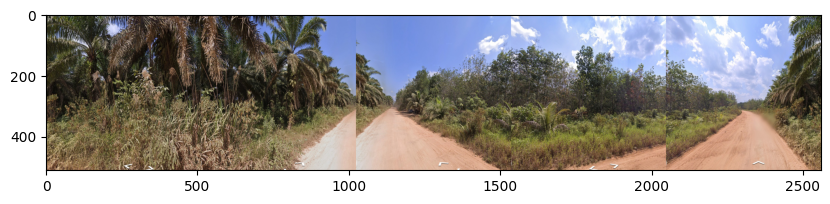

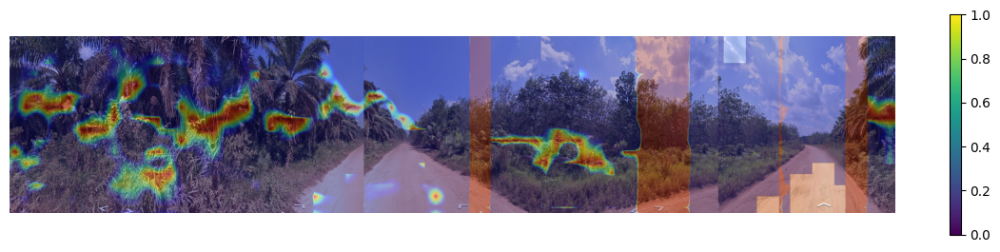

In [10]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import models
from skimage.io import imread
from skimage.transform import resize

class GradCamModel(nn.Module):
    def __init__(self, model=None):
        super().__init__()
        self.gradients = None
        self.tensorhook = []
        self.layerhook = []
        self.selected_out = None
        
        #PRETRAINED MODEL
        if model:
            self.pretrained = model
            self.layerhook.append(self.pretrained.layer4.register_forward_hook(self.forward_hook()))

        else:
            self.pretrained = models.resnet50(pretrained=True)
            self.layerhook.append(self.pretrained.layer4.register_forward_hook(self.forward_hook()))
        
        for p in self.pretrained.parameters():
            p.requires_grad = True
    
    def activations_hook(self,grad):
        self.gradients = grad

    def get_act_grads(self):
        return self.gradients

    def forward_hook(self):
        def hook(module, inp, out):
            self.selected_out = out
            self.tensorhook.append(out.register_hook(self.activations_hook))
        return hook

    def forward(self,x):
        out = self.pretrained(x)
        return out, self.selected_out


# img = imread(‘/content/tiger.jfif’) #'bulbul.jpg'
# img = resize(img, (224,224), preserve_range = True)
# img = np.expand_dims(img.transpose((2,0,1)),0)
# img /= 255.0
# mean = np.array([0.485, 0.456, 0.406]).reshape((1,3,1,1))
# std = np.array([0.229, 0.224, 0.225]).reshape((1,3,1,1))
# img = (img — mean)/std
# inpimg = torch.from_numpy(img).to(‘cuda:0’, torch.float32)

mean = np.array([0.485, 0.456, 0.406]).reshape((1,3,1,1))
std = np.array([0.229, 0.224, 0.225]).reshape((1,3,1,1))

model = models.resnet50()
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs,3139)

checkpoint = torch.load(r"C:\Users\Shadow\Documents\DLCV_Project_GeoGuessr_AI-Basti\models\pretrainedresnet50_14epoch.tar", map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

gcmodel = GradCamModel(model).to(device)

for img_index in range(26,52):
    img = dataset[img_index]
    class_label = np.array([img["geohash"].argmax(0)])

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.imshow(img["image"].permute(1,2,0))
    x = img["image"].to(device)[None, :] # Add batch dimension
    model.to(device)
    out, acts = gcmodel(x)
    acts = acts.detach().cpu()
    loss = nn.CrossEntropyLoss()(out,torch.from_numpy(class_label).to(device))
    loss.backward()
    grads = gcmodel.get_act_grads().detach().cpu()
    pooled_grads = torch.mean(grads, dim=[0,2,3]).detach().cpu()
    for i in range(acts.shape[1]):
        acts[:,i,:,:] *= pooled_grads[i]
    heatmap_j = torch.mean(acts, dim = 1).squeeze()
    heatmap_j_max = heatmap_j.max(axis = 0)[0]
    heatmap_j /= heatmap_j_max
    heatmap_j = heatmap_j.numpy()
    heatmap_j = resize(heatmap_j,(512,2560),preserve_range=True)
    cmap = mpl.cm.get_cmap("jet",256)
    heatmap_j2 = cmap(heatmap_j,alpha = 0.35)
    fig, axs = plt.subplots(1,1,figsize = (15,10))
    axs.imshow(img["image"].permute(1,2,0))
    heat_img = axs.imshow(heatmap_j2)
    # Add a color bar
    fig.colorbar(heat_img, cmap=cmap, shrink=0.3)
    plt.axis('off')
    plt.savefig(r"C:\Users\Shadow\Documents\DLCV_Project_GeoGuessr_AI-Basti\gradcam\img_"+str(img_index)+".png", bbox_inches='tight')
    plt.show()